# Social Network Analysis Project
## Networks comparisons: F·R·I·E·N·D·S vs The Big Bang Theory
### Vincenzo Collura

#### Imported Libraries

In [2]:
# Imported libraries
import sys
import collections
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from networkx.algorithms import community
from collections import defaultdict
import utils as ut

# Maximize output size visualization
np.set_printoptions(threshold=sys.maxsize)

# Paths
datasets_path = 'datasets/processed datasets/'
images_path = 'output images/'

#### Read the data
Keep in mind that: the data we are going to analyze are for the first season of the sitcom Friends and the first season plus 5 episodes of the second season of the sitcom The Big Bang Theory. Inasmuch as the first season of Friends consists of 24 episodes, while that of TBBT of 17 which going by adding the other 5 become 22. In addition, the average length of a Friends episode is about 22 min while TBBT's is 20 min (Wikipedia data), going to do a small count we can say that the analyzed episodes of Friends are about 4 more.

In [3]:
# Read a graph as list of edges with numeric weights.
g1 = nx.read_weighted_edgelist(datasets_path + 'tbbt_processed.txt', create_using=nx.Graph(), nodetype = str)
pos1 = nx.spring_layout(g1) # Position nodes using Fruchterman-Reingold force-directed algorithm.
g2 = nx.read_weighted_edgelist(datasets_path + 'friends_processed.txt', create_using=nx.Graph(), nodetype = str)
pos2 = nx.spring_layout(g2)

# Create the lists of the weights
with open(datasets_path + 'tbbt_processed.txt') as f:
    tbbt_weights = [int(line.split()[2]) for line in f]

with open(datasets_path + 'friends_processed.txt') as f:
    friends_weights = [int(line.split()[2]) for line in f]

# Create dict of degrees
d1 = dict(g1.degree)
d2 = dict(g2.degree)

### Visualize networks

The nets were created by changing the thickness of the edges according to weight, the size of the nodes according to degree, and the layout used uses the cores of the net, chosen because in my opinion it is very clear.

#### The Big Bang Theory Network

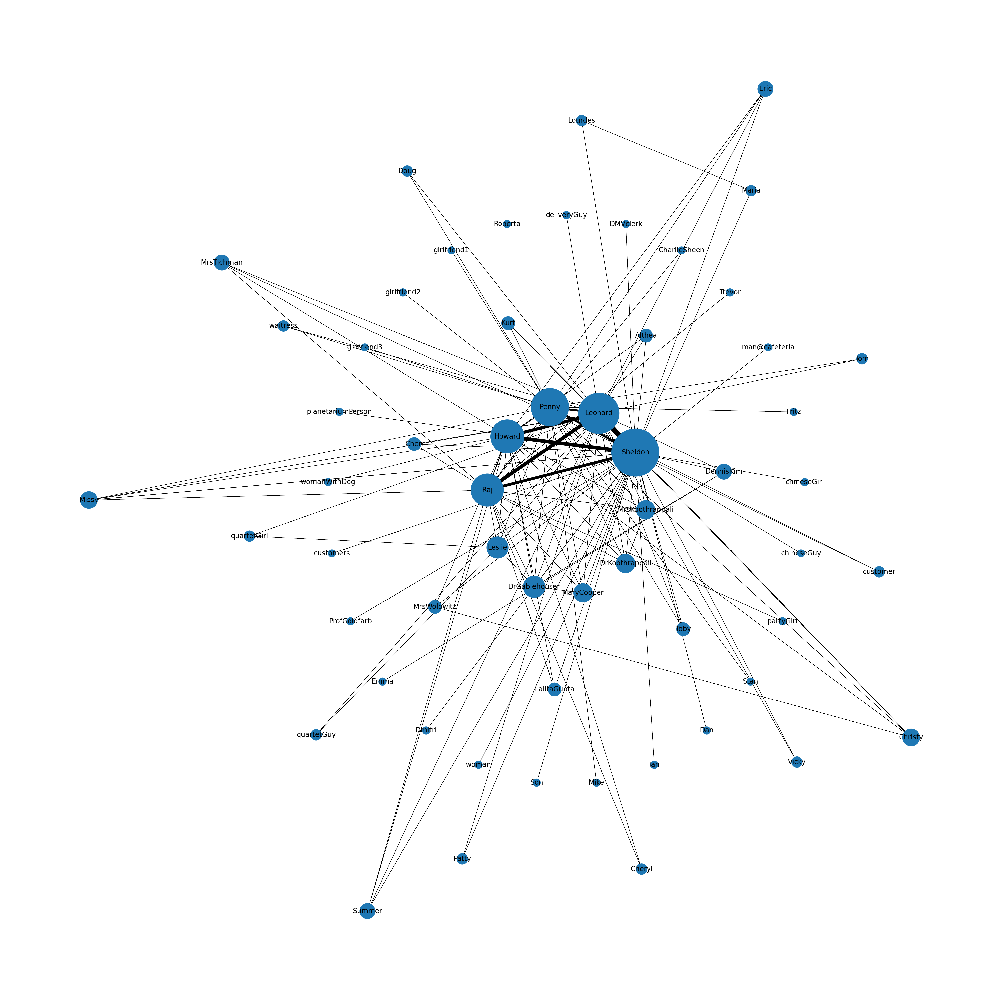

In [4]:
ut.visualize_network(g1, pos1, d1, tbbt_weights, 'tbbt_network.png')

#### F·R·I·E·N·D·S Network

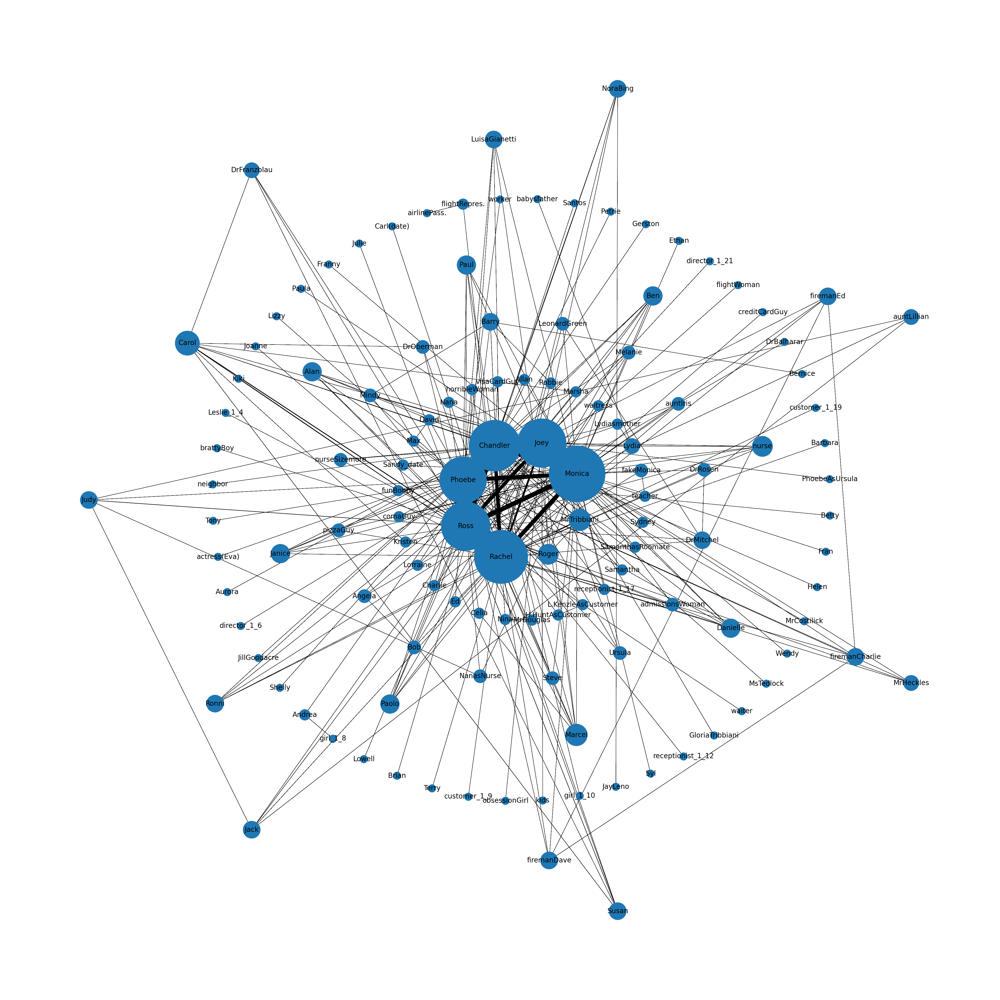

In [5]:
ut.visualize_network(g2, pos2, d2, friends_weights, 'friends_network.png')

# Measures

## Network properties

#### Number of nodes and edges

Analyzing the number of nodes and arcs within both networks we note that the number of nodes i.e., characters in The Big Bang Theory is about half that of characters in Friends (58, 126 respectively), as well as for arcs i.e., interactions between characters (126, 281 respectively). Considering that we are analyzing 2 fewer episodes of TBBT than Friends. The most interesting fact, however, is that the ratio of these (nodes to arcs, $ n \over e $) is practically the same for the two series i.e. 0.46 vs. 0.45. So we can infer from this figure that the number of character interactions based on the number of characters in the series is the same for both series.

In [6]:
n1 = g1.number_of_nodes()
n2 = g2.number_of_nodes()
e1 = g1.number_of_edges()
e2 = g2.number_of_edges()

print("TBBT nodes and edges: " + str(n1) + ", " + str(e1))
print("Friends nodes and edges: " + str(n2) + ", " + str(e2))
print("Relationship between nodes and edges in TBBT and Friends: " + str(round(n1/e1, 2)) + ", " + str(round(n2/e2, 2)))

TBBT nodes and edges: 58, 126
Friends nodes and edges: 126, 281
Relationship between nodes and edges in TBBT and Friends: 0.46, 0.45


#### Density

Instead, analyzing the density we notice a big difference between the two values, TBBT 0.076 and Friends 0.036, about half. Remembering that the density of a network is equal to the percentage of possible relationships in the network that are actually present. These values are due to the fact that the main characters in TBBT have knowledge in common plus secondary characters (except for Penny), in that, they work in the same place, in the same field, canteen, etc., and so the relationships that are actually present obviously grow. That is why in this case I consider density a date not very useful since, it does not matter whether the main characters interact with different or the same secondary characters. But how often and with what frequency.

In [7]:
tbbt_density = nx.density(g1)
friends_density = nx.density(g2)

print("TBBT density: " + str(round(tbbt_density, 3)))
print("Friends density: " + str(round(friends_density, 3)))

TBBT density: 0.076
Friends density: 0.036


#### Diameter and average shortest path length
By calculating the diameter and average shortest path length, the results obtained are similar for the two networks. The diameter in particular suggests to us how close all the characters are to each other, remembering that the diameter is the shortest distance between the two most distant nodes in the network (4 in TBBT, 5 in Friends). And in particular it is easy to see, just by looking at the network how even all secondary characters are immediately connected to at least one of the main characters, except for a few characters in Friends who are anyway only two edges away from the main characters. This shows us well how the two series are focused 360 degrees on the interactions of the main characters with very few (negligible) digressions. Confirming this statement is the average shortest path length, 2.24 in TBBT and 2.5 in Friends, i.e., all the characters catch up with each other with the help of only about two edges.

In [8]:
tbbt_diameter = nx.diameter(g1)
friends_diameter = nx.diameter(g2)

average_shortest_path_tbbt = nx.average_shortest_path_length(g1)
average_shortest_path_friends = nx.average_shortest_path_length(g2)

print("TBBT diameter: " + str(tbbt_diameter))
print("Friends diameter: " + str(friends_diameter) + "\n")

print("TBBT average shortest path length: " + str(round(average_shortest_path_tbbt, 2)))
print("Friends average shortest path length: " + str(round(average_shortest_path_friends, 2)))

TBBT diameter: 4
Friends diameter: 5

TBBT average shortest path length: 2.24
Friends average shortest path length: 2.5


## Centrality
#### Degree

One of the simplest centrality measure for a node in a network is just its degree.

We can immediately see a big difference between the two sitcoms, that is, in TBBT we have a clear distinction between Sheldon and the rest of the main characters whose values gradually drop from Leonard his roommate through Penny, the latter two have two very close middle ranks and as we know there is a love line between the two, then we move on to the Raj, Howard couple whose values are roughly identical. 
Whereas in Friends there is no prominent character, but from the beginning there is a gradual lowering of values. As we see, however, the highest degree is that of Monica the hostess where many scenes of the sitcom take place, while Phoebe's is the lowest. These two values contain the remaining 4 main characters who have very similar values to each other, among these characters are Ross and Rachel who make up the love line of the series and Chandler and Joey who make up the comedy duo line.

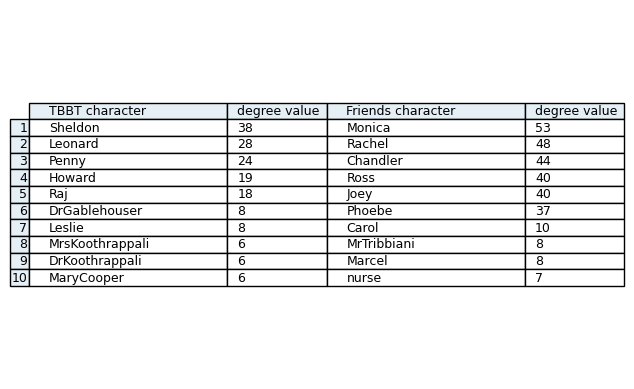

In [9]:
tbbt_degree = sorted(g1.degree(), key=lambda kv: kv[1])[::-1]
friends_degree = sorted(g2.degree(), key=lambda kv: kv[1])[::-1]

columns = ('TBBT character', 'degree value', 'Friends character', 'degree value')

ut.visualize_into_a_table(columns, 10, tbbt_degree, friends_degree, 'degree_table.png')

We can see how by plotting the degree distribution the two curves are very similar, almost equal, as if the network of Friends is the same as that of TBBT but multiplied by a constant. In particular the curve in front of us follows a power-law behavior.
Networks whose degree distribution follows a power-law behaviour are usually called scale-free networks.
The reason for the name comes from the fact that power laws are scale-invariant, i.e., that scaling the argument, here , by a constant factor just causes a multiplication of the original power-law relation by that constant.
This is also why we look for straight-line behaviours in log-log plots, which reduce the “noise” derived from constant multiplications.
Scale-free networks are highly robust networks that can survive the failure of a sensible number of their nodes.

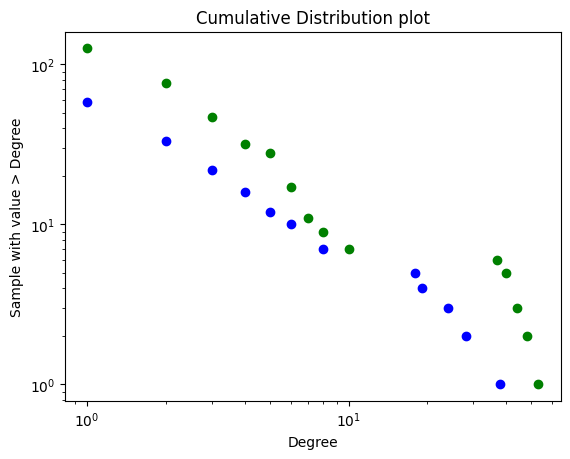

In [10]:
tbbt_degree_sequence = sorted([d for n, d in g1.degree()], reverse=True)  # degree sequence
friends_degree_sequence = sorted([d for n, d in g2.degree()], reverse=True)

tbbt_degreeCount = collections.Counter(tbbt_degree_sequence)
friends_degreeCount = collections.Counter(friends_degree_sequence)

deg1, cnt1 = zip(*tbbt_degreeCount.items())
deg2, cnt2 = zip(*friends_degreeCount.items())

cs = np.cumsum(cnt1)
plt.loglog(deg1, cs, 'bo')

cs = np.cumsum(cnt2)
plt.loglog(deg2, cs, 'go')

plt.savefig(images_path + "degree_distribution.png")
plt.title("Cumulative Distribution plot")
plt.ylabel("Sample with value > Degree")
plt.xlabel("Degree")
plt.show()

Although the amount of nodes and edges within the two networks are very different, the average node degree of the two sitcoms is practically the same. This means that the average each character interacts with about 4 other characters.

In [11]:
tbbt_avg_degree = np.sum([d[1] for d in g1.degree()])/g1.number_of_nodes()
friends_avg_degree = np.sum([d[1] for d in g2.degree()])/g2.number_of_nodes()

print("TBBT average degree: " + str(round(tbbt_avg_degree, 2)))
print("Friends average degree: " + str(round(friends_avg_degree, 2)))

TBBT average degree: 4.34
Friends average degree: 4.46


#### Eigenvector

Eigenvector centrality is an extended form of degree (centrality), which takes into account not only how many neighbours a node has, but also how central those neighbours themselves are. In this case eigenvector centrality confirms what was said in degree centrality, however, bringing the values among all the characters closer together, a closeness due to the very definition of eigenvector in that obviously all the main characters have connections to the central nodes themselves in the network. In fact, Sheldon of TBBT no longer has such a greater value gap than the others even though he remains the one with the greatest value, the same thing happens with Monica of Friends. The remaining characters have very close almost equal values, and thus the considerations made about the love line and the comic couple by analyzing the degree remain alive.

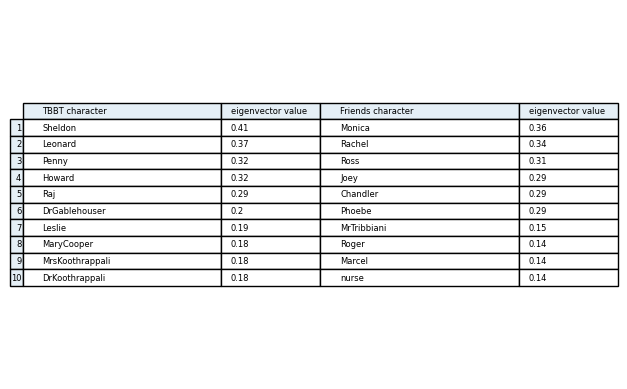

In [12]:
tbbt_eigenvector = sorted(nx.eigenvector_centrality(g1).items(), key=lambda kv: kv[1])[::-1]
friends_eigenvector = sorted(nx.eigenvector_centrality(g2).items(), key=lambda kv: kv[1])[::-1]

columns = ('TBBT character', 'eigenvector value', 'Friends character', 'eigenvector value')

ut.visualize_into_a_table(columns, 10, tbbt_eigenvector, friends_eigenvector, 'eigenvector_table.png')

Eigenvector centrality often has a right-skewed distribution (similar to that of the degree).

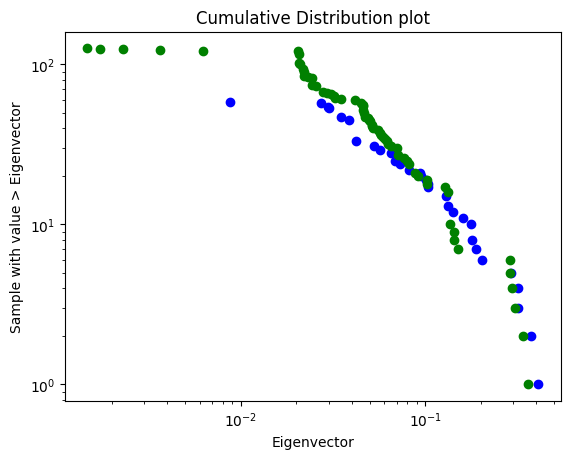

In [13]:
tbbt_eigenvector_sequence = sorted([d[1] for d in tbbt_eigenvector], reverse=True)
friends_eigenvector_sequence = sorted([d[1] for d in friends_eigenvector], reverse=True)

tbbt_degreeCount = collections.Counter(tbbt_eigenvector_sequence)
friends_degreeCount = collections.Counter(friends_eigenvector_sequence)

deg1, cnt1 = zip(*tbbt_degreeCount.items())
deg2, cnt2 = zip(*friends_degreeCount.items())

cs = np.cumsum(cnt1)
plt.loglog(deg1, cs, 'bo')

cs = np.cumsum(cnt2)
plt.loglog(deg2, cs, 'go')

plt.savefig(images_path + "eigenvector_distribution.png")
plt.title("Cumulative Distribution plot")
plt.ylabel("Sample with value > Eigenvector")
plt.xlabel("Eigenvector")
plt.show()

#### Betweenness

Betweenness centrality, also based on shortest paths, measures the extent to which a node lies on paths between other nodes. The assumption here is that paths lying on “trafficked” shortest paths have a more central role in the network, as gateways favoured by their closeness to (reach) the other nodes.

Even with betweenness centrality, the considerations made on TBBT remain the same and are even more confirmed, instead a little bit changes regarding Friends where things are a little subverted in support of the fact that unlike TBBT in Friends there is no real and proper protagonist, whom in TBBT we identify with Sheldon, but they are all protagonists in much the same way.

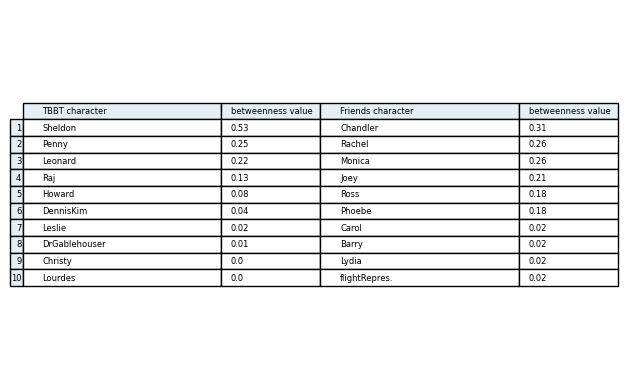

In [14]:
tbbt_betweenness = sorted(nx.betweenness_centrality(g1).items(), key=lambda kv: kv[1])[::-1]
friends_betweenness = sorted(nx.betweenness_centrality(g2).items(), key=lambda kv: kv[1])[::-1]

columns = ('TBBT character', 'betweenness value', 'Friends character', 'betweenness value')

ut.visualize_into_a_table(columns, 10, tbbt_betweenness, friends_betweenness, 'betweenness_table.png')

Betweenness centrality also tends to assume the same distribution.

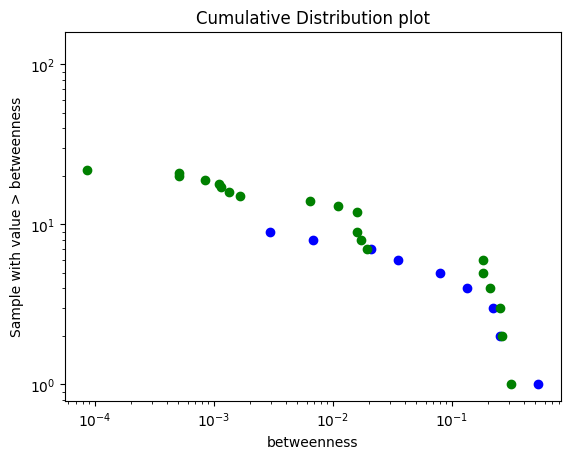

In [15]:
tbbt_betweenness_sequence = sorted([d[1] for d in tbbt_betweenness], reverse=True)
friends_betweenness_sequence = sorted([d[1] for d in friends_betweenness], reverse=True)

tbbt_degreeCount = collections.Counter(tbbt_betweenness_sequence)
friends_degreeCount = collections.Counter(friends_betweenness_sequence)

deg1, cnt1 = zip(*tbbt_degreeCount.items())
deg2, cnt2 = zip(*friends_degreeCount.items())

cs = np.cumsum(cnt1)
plt.loglog(deg1, cs, 'bo')

cs = np.cumsum(cnt2)
plt.loglog(deg2, cs, 'go')

plt.savefig(images_path + "betweenness_distribution.png")
plt.title("Cumulative Distribution plot")
plt.ylabel("Sample with value > betweenness")
plt.xlabel("betweenness")
plt.show()

#### Closeness

Differently from the previous centrality measures, based on nodes’ degree, closeness centrality uses the shortest paths in networks, measuring the mean distance from a node to other nodes.

Even with this measure no difference in TBBT, Sheldon with the highest value with the love line Leonard and Penny very close to each other and finally the comic duo with the same value. Always the same also in this case Friends with Monica with the highest value even if slightly and Phoebe with the lowest one, both containing the comic and amorous line of the Sitcom.

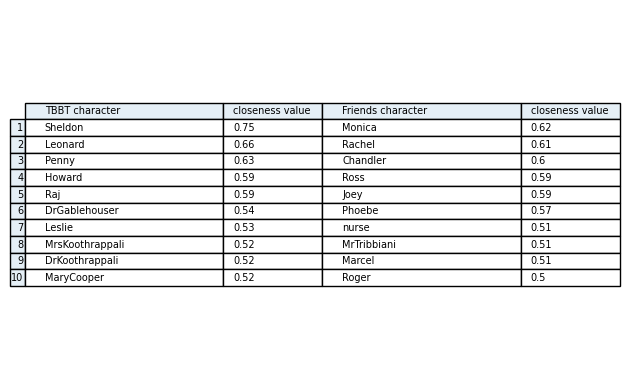

In [16]:
tbbt_closeness = sorted(nx.closeness_centrality(g1).items(), key=lambda kv: kv[1])[::-1]
friends_closeness = sorted(nx.closeness_centrality(g2).items(), key=lambda kv: kv[1])[::-1]

columns = ('TBBT character', 'closeness value', 'Friends character', 'closeness value')

ut.visualize_into_a_table(columns, 10, tbbt_closeness, friends_closeness, 'closeness_table.png')

### Groups of Nodes
#### Cliques

Here we can see, as expected, that obviously all the protagonists of the two series are part of the maximal clique in their respective networks, plus a few secondary characters who got to interact with everyone in some way.
Of these cliques in TBBT there are 4 with sizes between 6 and 7, while in Friends there are 9 with sizes from 7 to 8.
The most interesting fact, however, is that as we see the maximal cliques are not that big, 7 nodes for TBBT and 8 for Friends, so in addition to the 5 main characters in TBBT there are only two others, same thing for Friends (6 + 2).
This means that in any case the story also and largely develops on the parallel storylines of these characters and their subgroups and not on events that include everyone.
So secondary characters rarely interact with all the main characters but usually with subgroups of them, in both sitcoms.

[['CharlieSheen', 'Raj'], ['Stan', 'Penny'], ['partyGirl', 'Raj'], ['Roberta', 'Howard'], ['girlfriend2', 'Penny'], ['quartetGirl', 'Leonard', 'Leslie'], ['Emma', 'DennisKim'], ['Fritz', 'Penny'], ['Tom', 'Leonard', 'Penny'], ['waitress', 'Leonard', 'Penny'], ['womanWithDog', 'Leonard'], ['girlfriend1', 'Penny'], ['Mike', 'Penny'], ['Sheldon', 'Lourdes', 'Maria'], ['Sheldon', 'woman'], ['Sheldon', 'Jan'], ['Sheldon', 'customer', 'Penny'], ['Sheldon', 'planetariumPerson'], ['Sheldon', 'DMVclerk'], ['Sheldon', 'MrsWolowitz', 'Howard', 'Christy'], ['Sheldon', 'chineseGuy'], ['Sheldon', 'Dan'], ['Sheldon', 'Leonard', 'Patty'], ['Sheldon', 'Leonard', 'Chen', 'Raj'], ['Sheldon', 'Leonard', 'Vicky'], ['Sheldon', 'Leonard', 'Kurt', 'Penny'], ['Sheldon', 'Leonard', 'Howard', 'Raj', 'Summer'], ['Sheldon', 'Leonard', 'Howard', 'Raj', 'Penny', 'MrsKoothrappali', 'DrKoothrappali'], ['Sheldon', 'Leonard', 'Howard', 'Raj', 'Penny', 'Missy'], ['Sheldon', 'Leonard', 'Howard', 'Raj', 'Penny', 'DrGableho

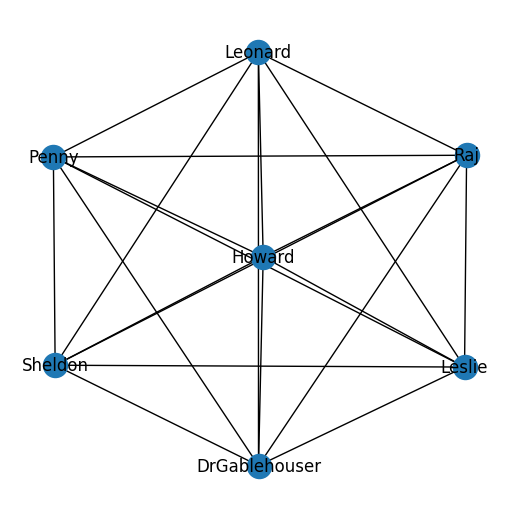

In [17]:
tbbt_cliques = list(nx.find_cliques(g1))
print(tbbt_cliques)
tbbt_cliques = [tbbt_cliques[i] for i in range(len(tbbt_cliques)) if len(tbbt_cliques[i]) > 2]
tbbt_cliques.sort(key=len)
tbbt_cliques = tbbt_cliques[::-1]
tbbt_max_clique = nx.relabel_nodes(nx.complete_graph(len(tbbt_cliques[0])),dict(enumerate(tbbt_cliques[0])))

plt.figure(3,figsize=(5,5)) 
nx.draw(tbbt_max_clique, with_labels=True)

# Save resulting images
plt.savefig(images_path + 'tbbt_max_clique.png')
plt.show()

[['Brian', 'Chandler'], ['Julie', 'Ross'], ['Bernice', 'Barry'], ['DrFranzblau', 'Carol', 'Ross', 'Susan'], ['DrFranzblau', 'Carol', 'Ross', 'Rachel'], ['kids', 'Joey'], ['airlinePass.', 'flightRepres.'], ['Shelly', 'Chandler'], ['MrDouglas', 'Chandler', 'Nina'], ['Leslie_1_4', 'Rachel'], ['Marsha', 'Carol', 'Ross'], ['customer_1_9', 'Rachel'], ['Andrea', 'girl_1_8'], ['Andrea', 'Chandler'], ['MsTedlock', 'Chandler'], ['Helen', 'Chandler'], ['flightWoman', 'Ross'], ['worker', 'Phoebe'], ['Betty', 'Phoebe'], ['nurseSizemore', 'Chandler', 'Joey', 'Ross'], ['Terry', 'Rachel'], ['DrBalharar', 'Ross'], ['SamanthasRoomate', 'Chandler', 'Joey'], ['Barbara', 'Rachel'], ['Lizzy', 'Phoebe'], ['GloriaTribbiani', 'Joey'], ['Tony', 'Phoebe'], ['MrCostilick', 'Chandler'], ['David', 'Max', 'Phoebe'], ['Aurora', 'Chandler'], ['Robbie', 'Barry', 'Rachel'], ['Gerston', 'Chandler'], ['Lydiasmother', 'Joey', 'Lydia'], ['L.KenzleAsCustomer', 'H.HuntAsCustomer', 'Phoebe'], ['Kristen', 'Carol', 'Ross'], ['Mo

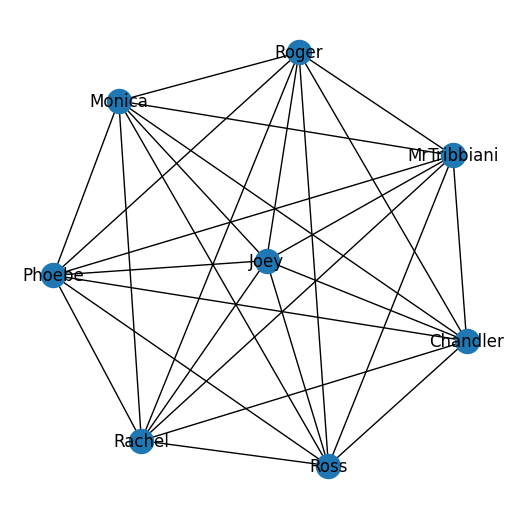

In [18]:
friends_cliques = list(nx.find_cliques(g2))
print(friends_cliques)
friends_cliques = [friends_cliques[i] for i in range(len(friends_cliques)) if len(friends_cliques[i]) > 2]
friends_cliques.sort(key=len)
friends_cliques = friends_cliques[::-1]
friends_max_clique = nx.relabel_nodes(nx.complete_graph(len(friends_cliques[0])),dict(enumerate(friends_cliques[0])))

plt.figure(3,figsize=(5,5))
nx.draw(friends_max_clique, with_labels=True)

# Save resulting images
plt.savefig(images_path + 'friends_max_clique.png')
plt.show()

In [19]:
print("TBBT number of nodes in a maximal clique: " + str(len(tbbt_cliques[0])))
print("Friends number of nodes in a maximal clique: " + str(len(friends_cliques[0])))

TBBT number of nodes in a maximal clique: 7
Friends number of nodes in a maximal clique: 8


#### Cores

A k-core is a maximal subgraph that contains nodes of degree k or more.

Of course as expected within the main cores we find the main characters in both sitcoms. What can be noticed, however, is that within the main core and in the immediately following cores is that all the secondary characters all have the same kind of relationship with one of the secondary characters, i.e.: parents and siblings, love relationships. 

For example (listed from the core with higher k to those with lower k): dr koothrappali and mrs koothrappali are Raj's parents, Mary Cooper is Sheldon's mom, Leslie has a love line with Leonard, Missy Sheldon's sister, Eric Penny's boyfriend, Christy Penny's friend who will have an affair with Haward, Summer love line with Howard, sole exception pe dr. Gablehouser that is the boss of Sheldon, Leonard and Rajesh etc..

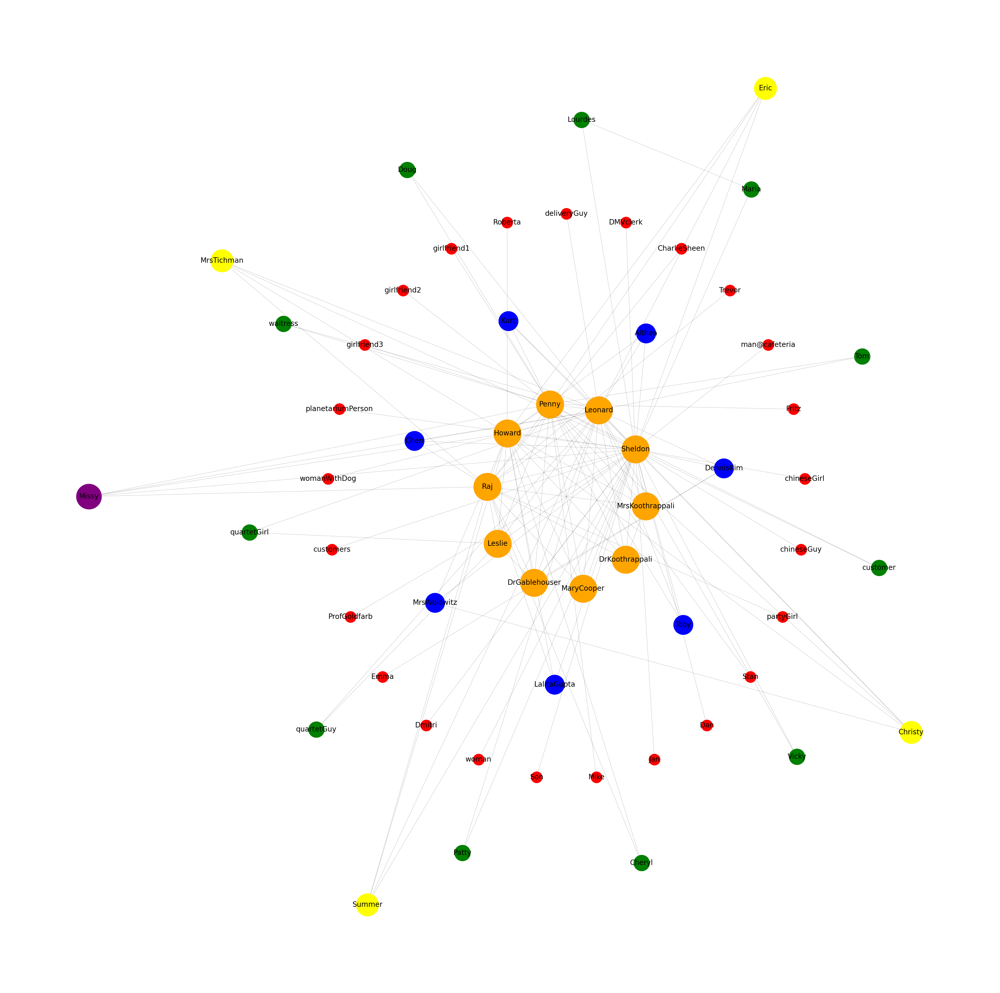

In [20]:
kcores = defaultdict(list)
n_cores = max(nx.core_number(g1).values())
for n, k in nx.core_number(g1).items():
    kcores[k].append(n)

# compute position of each node with shell layout
pos = nx.layout.shell_layout(g1, list(kcores.values()))
colors_list = []
colors = {1: 'red', 2: 'green', 3: 'blue', 4: 'yellow', 5: 'purple', 6: 'orange'}  # need to be improved, for demo


plt.figure(3,figsize=(50,50))

# draw nodes, edges and labels
for kcore, nodes in kcores.items():
    nx.draw_networkx_nodes(g1, pos, nodelist=nodes, node_color=colors[kcore], node_size=kcore*1000)

nx.draw_networkx_edges(g1, pos, width=0.2)
nx.draw_networkx_labels(g1, pos, font_size=20)

plt.axis('off')
plt.savefig(images_path + 'tbbt_cores.png')
plt.show()

On the other hand, in Friends we find: Roger that is Phoebe's boyfriend, Mr. Tribbiani that is Joey's father, Paul Ross's father-in-law, Ben Ross's son, Danielle love line with Chandler, Marcel monkey of Ross, Paul Rachel's boyfriend, Janice that is Chandler Bing's long-time on-off girlfriend, Alan that is Monica's boyfriend (the nurse who is the exception) etc..

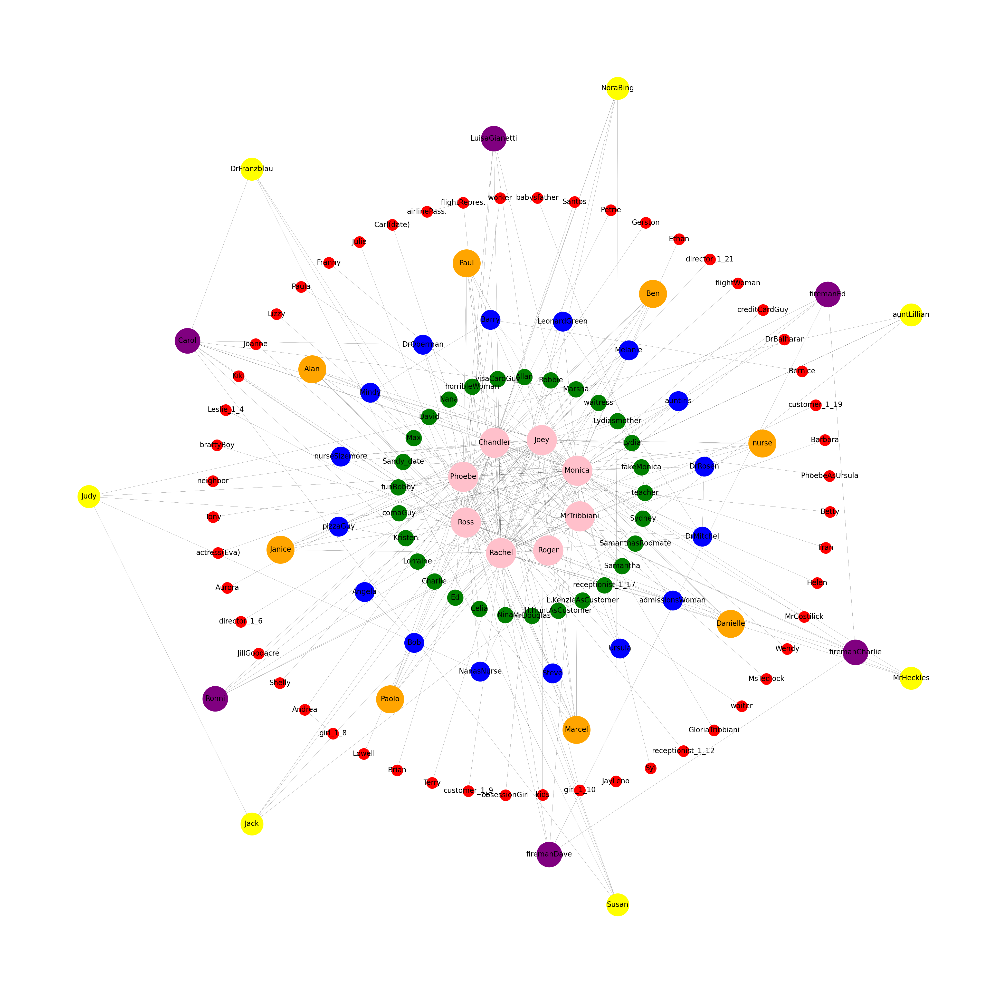

In [21]:
kcores = defaultdict(list)
n_cores = max(nx.core_number(g2).values())

for n, k in nx.core_number(g2).items():
    kcores[k].append(n)

# compute position of each node with shell layout
pos = nx.layout.shell_layout(g2, list(kcores.values()))
colors_list = []
colors = {1: 'red', 2: 'green', 3: 'blue', 4: 'yellow', 5: 'purple', 6: 'orange', 7: 'pink'}  # need to be improved, for demo


plt.figure(3,figsize=(50,50))

# draw nodes, edges and labels
for kcore, nodes in kcores.items():
    nx.draw_networkx_nodes(g2, pos, nodelist=nodes, node_color=colors[kcore], node_size=kcore*1000)

nx.draw_networkx_edges(g2, pos, width=0.2)
nx.draw_networkx_labels(g2, pos, font_size=20)

plt.axis('off')
plt.savefig(images_path + 'friends_cores.png')
plt.show()

Moreover, in all calculated centrality measures, immediately after the main protagonists we can always notice the same secondary characters, those in the cores with higher k.

So we understood how sitcom users like to know where the main characters come from, then the secondary characters who are part of the protagonists' family. Or the love lines between them and the protagonists.
A particular one found twice are the secondary characters who go between the main love lines: for example, between Ross and Rachel we have Paul, while between Leonard and Penny we have Eric.

#### Clustering Coefficient

The clustering coefficient quantifies the density of triads — i.e., strongly connected triangles of nodes — in a network.

The two networks have a high clustering coefficient (0.48 for TBBT, and 0.51 for Friends), i.e., an approximate 10% to 60% probability that two neighbors of a node are themselves neighbors.
In addition to the network-level clustering coefficient, we can also study the distribution of the local (node-level) clustering coefficient (the fraction of pairs of node i's neighbors that are themselves neighbors). Interestingly, on average, nodes with a high degree tend to have low local clustering. One explanation for this phenomenon is that nodes tend to aggregate and connect internally to their "groups." Thus, in networks that exhibit this behavior, nodes belonging to small groups are forced to have a low degree, but at the same time their local clustering coefficient tends to be larger because each group, being mostly detached from the rest of the network, increases its internal clustering coefficient.


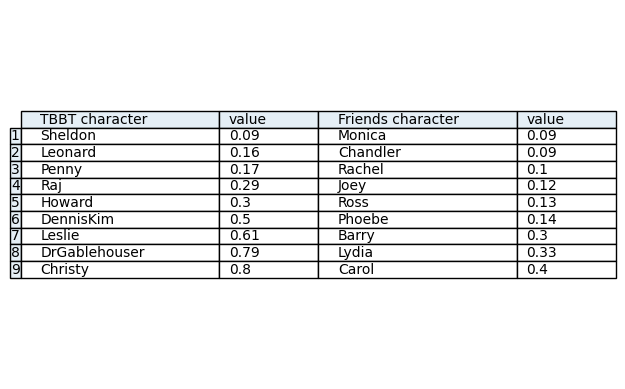

TBBT clustering coefficients average: 0.48
Friends clustering coefficients average: 0.51


In [22]:
tbbt_clustering_coefficients = [i for i in sorted(nx.clustering(g1).items(), key=lambda kv: kv[1]) if i[1] != 0 and i[1] != 1]
friends_clustering_coefficients = [i for i in sorted(nx.clustering(g2).items(), key=lambda kv: kv[1]) if i[1] != 0 and i[1] != 1]

tbbt_clustering_coefficients_avg = nx.average_clustering(g1)
friends_clustering_coefficients_avg = nx.average_clustering(g2)

columns = ('TBBT character', 'value', 'Friends character', 'value')

ut.visualize_into_a_table(columns, 9, tbbt_clustering_coefficients, friends_clustering_coefficients, 'clustering_coefficients_table.png')

print("TBBT clustering coefficients average: " + str(round(tbbt_clustering_coefficients_avg, 2)))
print("Friends clustering coefficients average: " + str(round(friends_clustering_coefficients_avg, 2)))

#### Communities

The algorithm produced 4 communities for TBBT and 6 for Friends. In particular for Friends he produced a community per character, which makes a lot of sense, since in each of these communities there are friendships and kinships of each specific character and few of these are in common with other main characters, or they are but only with some of them. We are thus linked to the fact with the cores. In particular, we can note that generally all the communities are well separated, as mentioned except for some characters, except the two communities that are closest (between which there are more edges) are that of Chandler and Joey who I also expected to find in the same community, but it is evident that there is a very strong bond between the two roommates. For TBBT we find the exact same results, one community per character that contains friendships, person and kinship of that group. Except for the communities of Raj and Howard which is the same, again supporting the similarity between the comedic couples Raj-Howard and Chandler-Joey.

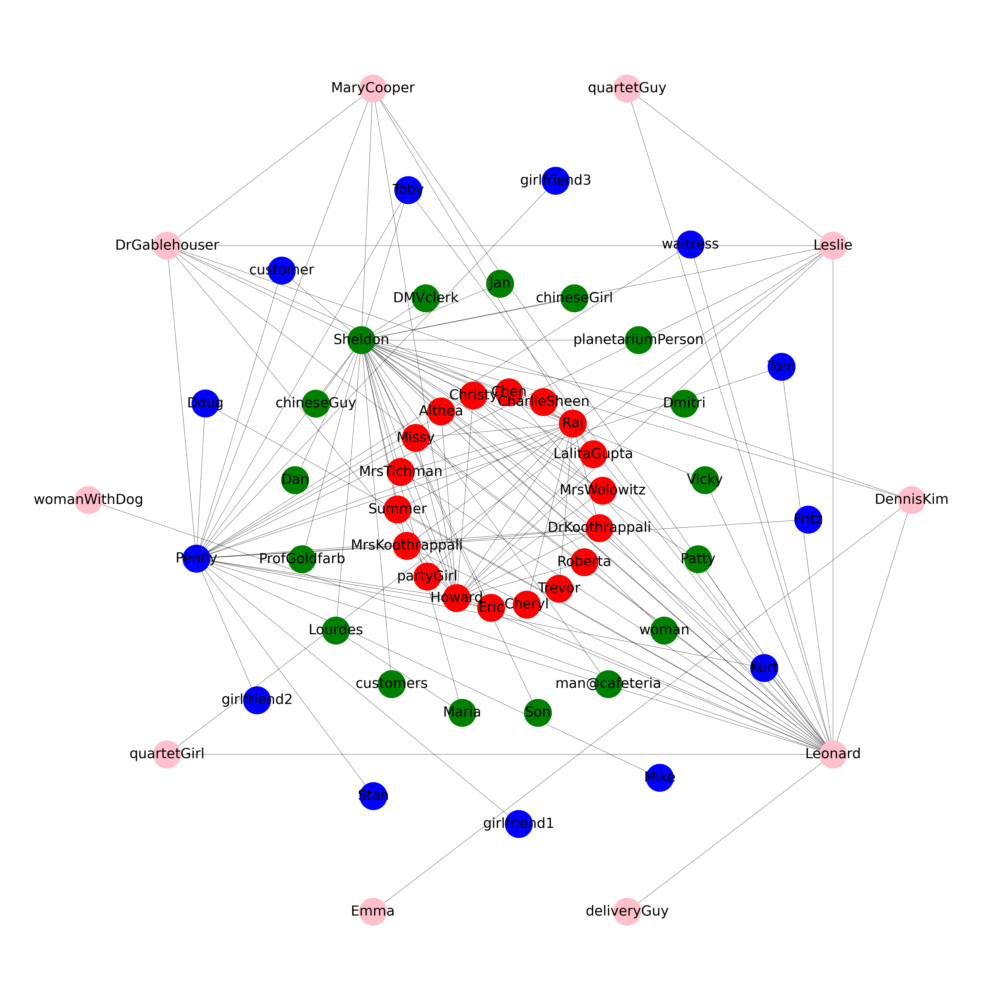

In [23]:
tbbt_communities = []

for c in community.greedy_modularity_communities(g1):
    tbbt_communities.append(list(c))

colors = ['red', 'green', 'blue', 'pink']

#pos = nx.spring_layout(g1) #calculate position for each node
pos = nx.layout.shell_layout(g1, tbbt_communities)

plt.figure(3,figsize=(50,50))

nx.draw(g1, pos, edge_color='k', font_weight='light', node_size= 280, width= 0.9)
nx.draw_networkx_labels(g1, pos, font_size=50)

#For each community list, draw the nodes, giving it a specific color.
for i in range(len(tbbt_communities)):
    nx.draw_networkx_nodes(g1, pos, nodelist=tbbt_communities[i], node_color=colors[i], node_size=10000)

plt.savefig(images_path + 'tbbt_communities.png')
plt.show()

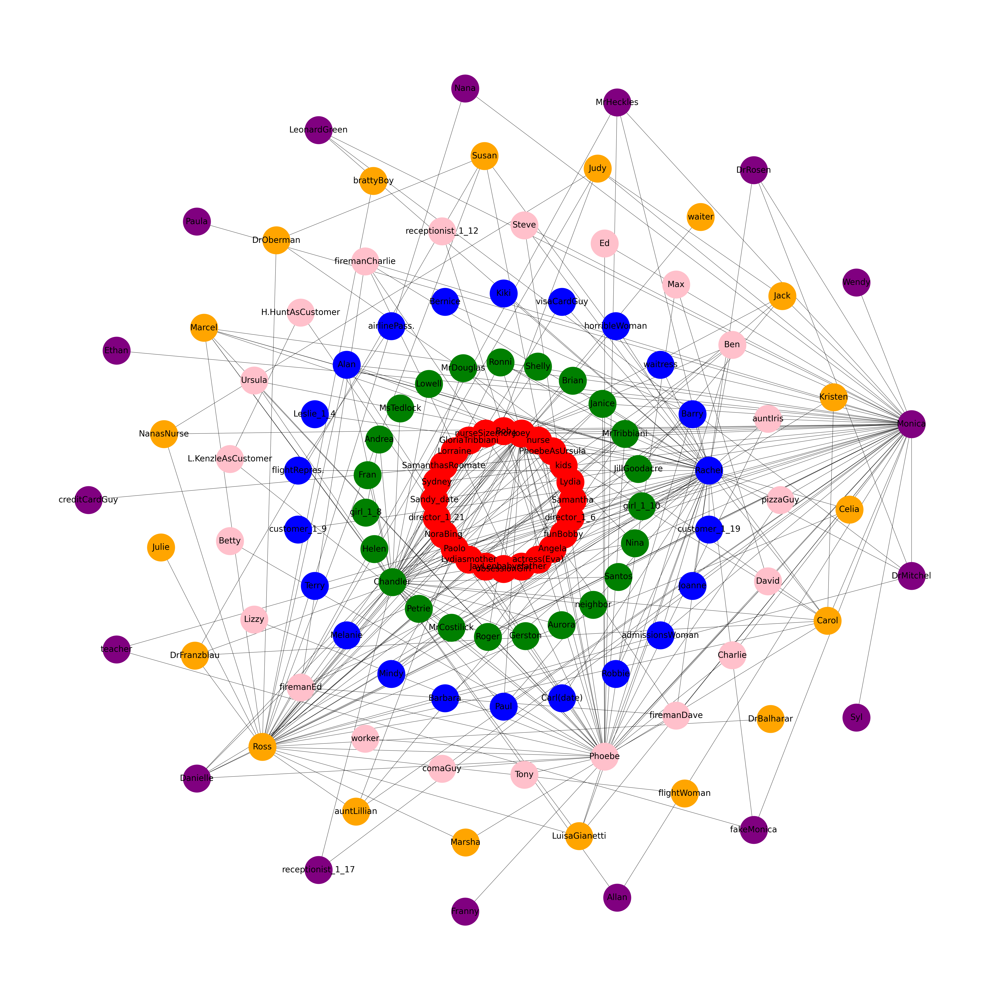

In [24]:
friends_communities = []

for c in community.greedy_modularity_communities(g2):
    friends_communities.append(list(c))

colors = ['red', 'green', 'blue', 'pink', 'orange', 'purple']

#pos = nx.spring_layout(g2) #calculate position for each node
pos = nx.layout.shell_layout(g2, friends_communities)

plt.figure(3,figsize=(50,50))

nx.draw(g2, pos, edge_color='k', font_weight='light', node_size= 280, width= 0.9)
nx.draw_networkx_labels(g2, pos, font_size=30)

#For each community list, draw the nodes, giving it a specific color.
for i in range(len(friends_communities)):
    nx.draw_networkx_nodes(g2, pos, nodelist=friends_communities[i], node_color=colors[i], node_size=10000)

plt.savefig(images_path + 'friends_communities.png')
plt.show()

## Similarity
#### Regular Equivalence
There are two fundamental measures of network similarity: structural equivalence and regular equivalence.
To figure out which character from Friends corresponds to which character from TBBT and vice versa, regular equivalence was chosen to be applied. Regular equivalence of two nodes is the count of neighbours that are themselves similar.
This measure was implemented by hand using the following video as a basis: https://www.youtube.com/watch?v=GABY3YMAaPg&ab_channel=KanchanBhal

In [25]:
friends_main = ['Ross', 'Phoebe', 'Chandler', 'Joey', 'Rachel', 'Monica']
tbbt_main = ['Sheldon', 'Leonard', 'Penny', 'Howard', 'Raj']

# Read a graph as list of edges with numeric weights.
union = nx.read_weighted_edgelist(datasets_path + 'union.txt', create_using=nx.Graph(), nodetype = str)

a1 = nx.to_scipy_sparse_array(union).todense()

union_alpha = 1/max(np.linalg.eigh(a1)[0]) - ((1/max(np.linalg.eigh(a1)[0]))/4)

I = np.identity(a1.shape[0])

union_regular_equivalence_matrix = np.linalg.inv((I - (union_alpha * a1)))

maxx = 0
union_index = np.zeros(union_regular_equivalence_matrix.shape[0])

for i in range(union_regular_equivalence_matrix.shape[0]):
    for j in range(union_regular_equivalence_matrix.shape[0]):
        if ((list(union.nodes())[i] in tbbt_main and list(union.nodes())[j] in friends_main)):
            if i != j and union_regular_equivalence_matrix[i][j] > maxx:
                maxx = union_regular_equivalence_matrix[i][j]
                union_index[i] = j

    if list(union.nodes())[i] in tbbt_main:
        friends_main.remove(list(union.nodes())[int(union_index[i])])
    maxx = 0

union_regular_similarity = []

requivalence = []

for i in range(len(union_index)):
    if (list(union.nodes())[i] in tbbt_main):
        requivalence.append(tuple([list(union.nodes())[i], list(union.nodes())[int(union_index[i])]]))

The results found confirm some of our suspicions, in fact, regular equivalence found that the most similar characters are Sheldon and Monica as expected. As for Leonard and Penny the respective ones are Rachel and Ross, the two love lines as expected but in reverse (as if to emphasize how Leonard is the girls in the couple). As for the comic duo the assumptions had with the centrality measures were only partially met, namely, the similarity between Howard and Chandler while Raj is compared to Phoebe and not Joey as expected.

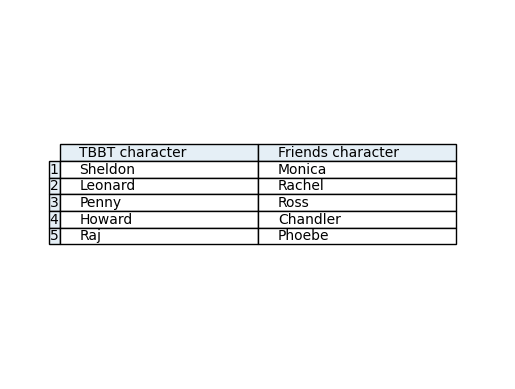

In [27]:
columns = ('TBBT character', 'Friends character')

rows = [str(i+1) for i in range(len(requivalence))]
data = []

for i in range(len(requivalence)):
    data.append([str(requivalence[i][0]), str(requivalence[i][1])])

rcolors = plt.cm.BuPu(np.full(len(rows), 0.1))
ccolors = plt.cm.BuPu(np.full(len(columns), 0.1))
    
the_table = plt.table(cellText=data,
                        rowLabels=rows,
                        rowColours=rcolors,
                        rowLoc='right',
                        colColours=ccolors,
                        colLabels=columns,
                        loc='center', 
                        cellLoc='left', 
                        colLoc='left', 
                        colWidths= [0.4, 0.4])
plt.axis('off')
plt.savefig(images_path + 'regular_equivalence.png')
plt.show()